# Problem Statement

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:-Create a predictive model which helps  to predict seven different cover types in four different wilderness areas of the Forest with the best accuracy.

# Load Dataset

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings('ignore')

In [3]:
pd.set_option('display.max_columns',None)

In [4]:
data = pd.read_csv('train.csv')
data

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15115,15116,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,15117,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,15118,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,15119,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


In [5]:
original = data.copy()

In [6]:
data.drop('Id',axis=1,inplace=True)

# Domain Analysis

### Elevation
Elevation refers to the height above sea level at which the forest is located(in meters)
### Aspect 
Aspect refers to the compass direction a slope faces (in degrees)
### Slope 
Slope refers to the incline or gradient of the land surface (in degrees)
### Horizontal_Distance_To_Hydrology 
Horiziontal Distance to nearest surface water features
### Vertical_Distance_To_Hydrology 
Vertical Distance to nearest surface water features
### Horizontal_Distance_To_Roadways 
Horizintal Distance to nearest roadway
### Hillshade_9am 
Hillshade refres to visual representation of the shading and shadows created by terrain features at 9am
### Hillshade_Noon  
Hillshade refres to visual representation of the shading and shadows created by terrain features at 12 pm
### Hillshade_3pm  
Hillshade refres to visual representation of the shading and shadows created by terrain features at 3pm
### Horizontal_Distance_To_Fire_Points 
Horiziontal Distance to nearest wildfire ignition points

### Wilderness_Area 
- Wilderness_Area refers to large, relatively undisturbed areas of land that remain in a natural state with minimal human impact
- The wilderness areas are:
1. Rawah Wilderness Area
2. Neota Wilderness Area
3. Comanche Peak Wilderness Area
4. Cache la Poudre Wilderness Area

### Soil_Type  
- Types of soil
- The soil types are:
1. Cathedral family - Rock outcrop complex, extremely stony.
2. Vanet - Ratake families complex, very stony.
3. Haploborolis - Rock outcrop complex, rubbly.
4. Ratake family - Rock outcrop complex, rubbly.
5. Vanet family - Rock outcrop complex complex, rubbly.
6. Vanet - Wetmore families - Rock outcrop complex, stony.
7. Gothic family.
8. Supervisor - Limber families complex.
9. Troutville family, very stony.
10. Bullwark - Catamount families - Rock outcrop complex, rubbly.
11. Bullwark - Catamount families - Rock land complex, rubbly.
12. Legault family - Rock land complex, stony.
13. Catamount family - Rock land - Bullwark family complex, rubbly.
14. Pachic Argiborolis - Aquolis complex.
15. unspecified in the USFS Soil and ELU Survey.
16. Cryaquolis - Cryoborolis complex.
17. Gateview family - Cryaquolis complex.
18. Rogert family, very stony.
19. Typic Cryaquolis - Borohemists complex.
20. Typic Cryaquepts - Typic Cryaquolls complex.
21. Typic Cryaquolls - Leighcan family, till substratum complex.
22. Leighcan family, till substratum, extremely bouldery.
23. Leighcan family, till substratum - Typic Cryaquolls complex.
24. Leighcan family, extremely stony.
25. Leighcan family, warm, extremely stony.
26. Granile - Catamount families complex, very stony.
27. Leighcan family, warm - Rock outcrop complex, extremely stony.
28. Leighcan family - Rock outcrop complex, extremely stony.
29. Como - Legault families complex, extremely stony.
30. Como family - Rock land - Legault family complex, extremely stony.
31. Leighcan - Catamount families complex, extremely stony.
32. Catamount family - Rock outcrop - Leighcan family complex, extremely stony.
33. Leighcan - Catamount families - Rock outcrop complex, extremely stony.
34. Cryorthents - Rock land complex, extremely stony.
35. Cryumbrepts - Rock outcrop - Cryaquepts complex.
36. Bross family - Rock land - Cryumbrepts complex, extremely stony.
37. Rock outcrop - Cryumbrepts - Cryorthents complex, extremely stony.
38. Leighcan - Moran families - Cryaquolls complex, extremely stony.
39. Moran family - Cryorthents - Leighcan family complex, extremely stony.
40. Moran family - Cryorthents - Rock land complex, extremely stony.

### Cover_Type 
Forest Cover Type designation.This is the Target variable of Cover Type having 7 different categories.


# Task 1:-Prepare a complete data analysis report on the given data.


# Basic Checks

In [7]:
data.shape

(15120, 55)

In [8]:
data.size

831600

In [9]:
data.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40

In [10]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 15120 entries, 0 to 15119
Data columns (total 55 columns):
 #   Column                              Non-Null Count  Dtype
---  ------                              --------------  -----
 0   Elevation                           15120 non-null  int64
 1   Aspect                              15120 non-null  int64
 2   Slope                               15120 non-null  int64
 3   Horizontal_Distance_To_Hydrology    15120 non-null  int64
 4   Vertical_Distance_To_Hydrology      15120 non-null  int64
 5   Horizontal_Distance_To_Roadways     15120 non-null  int64
 6   Hillshade_9am                       15120 non-null  int64
 7   Hillshade_Noon                      15120 non-null  int64
 8   Hillshade_3pm                       15120 non-null  int64
 9   Horizontal_Distance_To_Fire_Points  15120 non-null  int64
 10  Wilderness_Area1                    15120 non-null  int64
 11  Wilderness_Area2                    15120 non-null  int64
 12  Wild

In [11]:
data.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [12]:
data.tail()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
15115,2607,243,23,258,7,660,170,251,214,1282,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15116,2603,121,19,633,195,618,249,221,91,1325,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15117,2492,134,25,365,117,335,250,220,83,1187,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15118,2487,167,28,218,101,242,229,237,119,932,0,0,1,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3
15119,2475,197,34,319,78,270,189,244,164,914,0,0,1,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,3


In [13]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
Elevation,15120.0,2749.322553,417.678187,1863.0,2376.0,2752.0,3104.00,3849.0
Aspect,15120.0,156.676653,110.085801,0.0,65.0,126.0,261.00,360.0
Slope,15120.0,16.501587,8.453927,0.0,10.0,15.0,22.00,52.0
Horizontal_Distance_To_Hydrology,15120.0,227.195701,210.075296,0.0,67.0,180.0,330.00,1343.0
Vertical_Distance_To_Hydrology,15120.0,51.076521,61.239406,-146.0,5.0,32.0,79.00,554.0
Horizontal_Distance_To_Roadways,15120.0,1714.023214,1325.066358,0.0,764.0,1316.0,2270.00,6890.0
Hillshade_9am,15120.0,212.704299,30.561287,0.0,196.0,220.0,235.00,254.0
Hillshade_Noon,15120.0,218.965608,22.801966,99.0,207.0,223.0,235.00,254.0
Hillshade_3pm,15120.0,135.091997,45.895189,0.0,106.0,138.0,167.00,248.0
Horizontal_Distance_To_Fire_Points,15120.0,1511.147288,1099.936493,0.0,730.0,1256.0,1988.25,6993.0


In [14]:
data.Elevation.unique()

array([2596, 2590, 2804, ..., 3504, 3510, 3604], dtype=int64)

In [15]:
for column in data:
    uniques = data[column].unique()
    print(f'\033[1m{column}: \033[0m\n{uniques}\n','-' * 80)

Elevation: 
[2596 2590 2804 ... 3504 3510 3604]
 --------------------------------------------------------------------------------
Aspect: 
[ 51  56 139 155  45 132  49  59 201 151 134 214 157 259  72   0  38  71
 209 114  54  22 135 163 148 117 122 105 102  23  41 125  92  98 354 347
 346 330 128  68  94  99  66 100 323  79  81 315  74  11  42  75 107  90
  40  63  13  80 166   6  30 118 160 326 153 143 352  14 358 332  18 306
 173  31 164  34  84 170 211  32  57 348 333 324  88 111  53  58  76  17
 124 119 320 112  83   1  37 356 307   7  12 344 228 284 299 220   2  95
 289  21  20 200 349 328 221 257 276 196 189 130 357  15   8 288 129  28
  86 292 115  29 180 116  46 256 338 127 319  89  43 188  50 138 312   9
  10  36 167 260 187 279 245  27 359  16  48 149  60  77 230 152  70 325
 126 222 109  85  25 176 144 175 162  73  39  78 331 329 355  87 285 108
 106  24  52 261 232 246 342  61 141 216 236 254 336 278  62 237 281  69
 251 150 185 110 103 243 215 238 317 252 136 131 133 123 1

In [16]:
data['Elevation'].value_counts()

2830    25
2290    25
3371    24
2952    23
2955    23
        ..
3692     1
3694     1
3702     1
3728     1
3604     1
Name: Elevation, Length: 1665, dtype: int64

In [17]:
data.Elevation.value_counts()

2830    25
2290    25
3371    24
2952    23
2955    23
        ..
3692     1
3694     1
3702     1
3728     1
3604     1
Name: Elevation, Length: 1665, dtype: int64

In [18]:
for column in data:
    value = data[column].value_counts()
    print(f'\033[1m{column}: \033[0m\n{value}\n','-' * 80)

Elevation: 
2830    25
2290    25
3371    24
2952    23
2955    23
        ..
3692     1
3694     1
3702     1
3728     1
3604     1
Name: Elevation, Length: 1665, dtype: int64
 --------------------------------------------------------------------------------
Aspect: 
45     117
0      110
90     109
63      89
76      87
      ... 
263     10
248     10
249      9
226      7
360      2
Name: Aspect, Length: 361, dtype: int64
 --------------------------------------------------------------------------------
Slope: 
11    740
10    739
13    717
14    699
12    677
15    664
9     664
16    640
17    598
8     574
7     573
18    558
20    552
19    519
21    465
6     465
22    458
23    450
5     423
24    394
25    359
26    329
28    313
4     305
27    297
29    258
31    218
30    216
3     210
32    187
33    143
2     134
34    131
35    101
1      78
36     68
37     58
38     36
39     32
41     18
40     16
46     15
44      5
0       5
49      5
45      3
47      3
42      3
4

### Insights
- In this dataset, there are 15120 rows and 56 columns.
- The datatype of all columns is integer.
- There is no null/missing values present in the dataset.
- Target column is cover_type ( cover types values  are: 1 to 7 )
- The Id column has been dropped and now the number of column is 55.
- The categorical data - Wilderness Area , Soil Type and Cover Type is already been encoded.

# Exploratory Data Analysis

## Univariate

In [19]:
data.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,2596,51,3,258,0,510,221,232,148,6279,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2590,56,2,212,-6,390,220,235,151,6225,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,2804,139,9,268,65,3180,234,238,135,6121,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,2785,155,18,242,118,3090,238,238,122,6211,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,2595,45,2,153,-1,391,220,234,150,6172,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [20]:
data.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40

<Axes: xlabel='Elevation', ylabel='Count'>

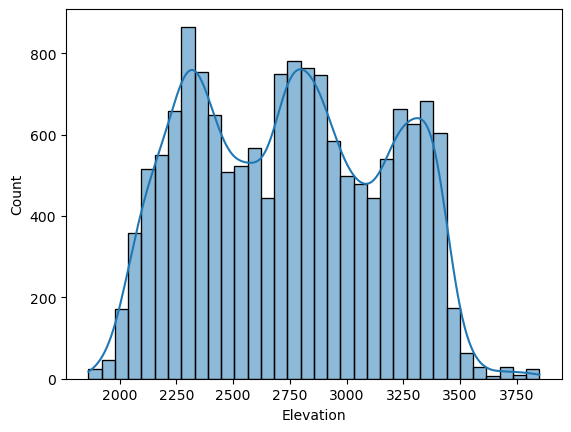

In [21]:
sns.histplot(data=data, x='Elevation',kde=True)

In [22]:
con_data =  data[['Elevation', 'Aspect', 'Slope',
                  'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
                  'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
                  'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points']]
con_data.head()

,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points
0,2596,51,3,258,0,510,221,232,148,6279
1,2590,56,2,212,-6,390,220,235,151,6225
2,2804,139,9,268,65,3180,234,238,135,6121
3,2785,155,18,242,118,3090,238,238,122,6211
4,2595,45,2,153,-1,391,220,234,150,6172


In [23]:
dis_data = data.drop(con_data,axis=1)
dis_data.head()

,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


In [24]:
len(con_data.columns)

10

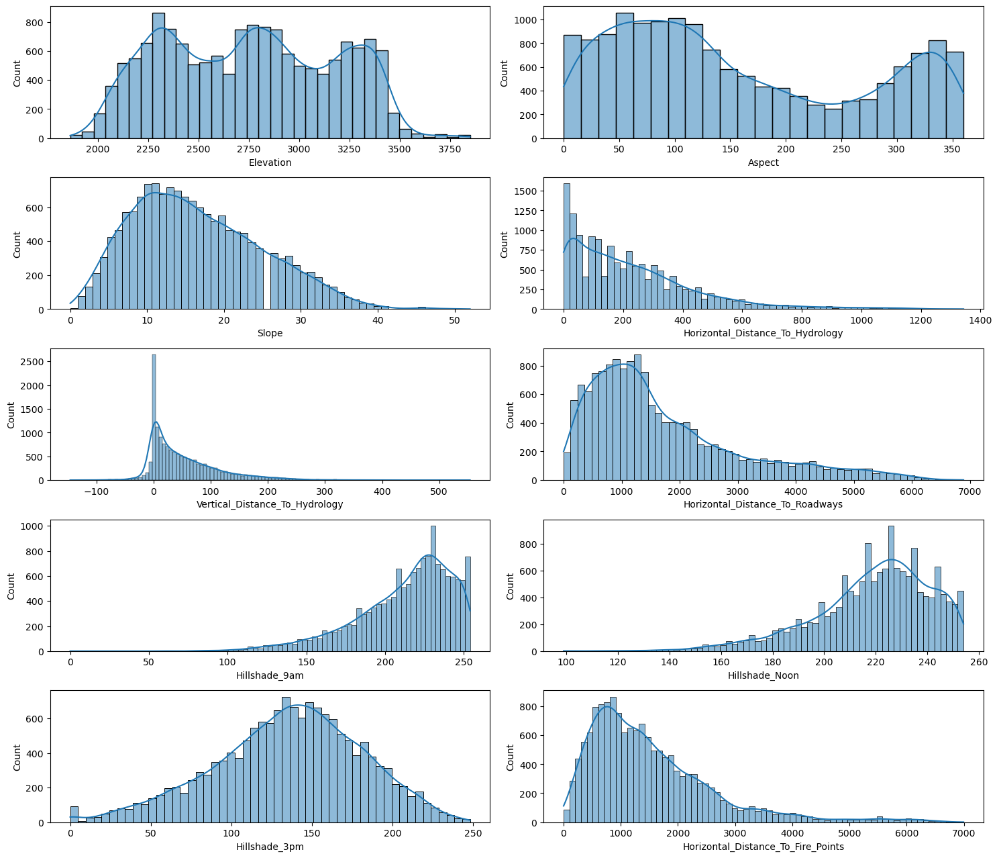

In [25]:
plt.figure(figsize=(15,15))
plotnumber = 1
for column in con_data:
    if plotnumber<12:
        plt.subplot(6,2,plotnumber)
        sns.histplot(x=data[column],kde=True)
        plotnumber+=1
plt.tight_layout()

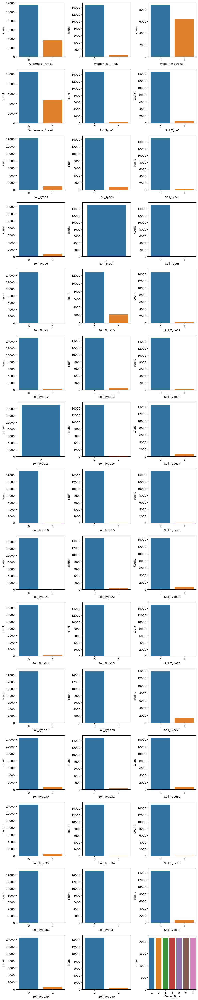

In [26]:
plt.figure(figsize=(10,50))
plotnumber = 1
for column in dis_data:
    if plotnumber<50:
        plt.subplot(15,3,plotnumber)
        sns.countplot(x=data[column])
        plotnumber+=1
plt.tight_layout()

<Axes: xlabel='Cover_Type', ylabel='count'>

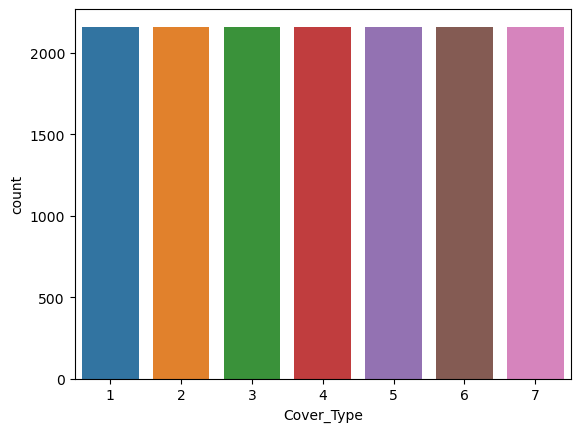

In [27]:
sns.countplot(x=data['Cover_Type'])

### Insights 
 - There are 10 continuous data and 45 discrete data.
 - Every continous data are not normal distributions.
 - The target data Cover_Type is balanced data.
 - Wilderness Area 3 has the highest value.

## Bivariate

In [28]:
data.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points', 'Wilderness_Area1',
       'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4',
       'Soil_Type1', 'Soil_Type2', 'Soil_Type3', 'Soil_Type4', 'Soil_Type5',
       'Soil_Type6', 'Soil_Type7', 'Soil_Type8', 'Soil_Type9', 'Soil_Type10',
       'Soil_Type11', 'Soil_Type12', 'Soil_Type13', 'Soil_Type14',
       'Soil_Type15', 'Soil_Type16', 'Soil_Type17', 'Soil_Type18',
       'Soil_Type19', 'Soil_Type20', 'Soil_Type21', 'Soil_Type22',
       'Soil_Type23', 'Soil_Type24', 'Soil_Type25', 'Soil_Type26',
       'Soil_Type27', 'Soil_Type28', 'Soil_Type29', 'Soil_Type30',
       'Soil_Type31', 'Soil_Type32', 'Soil_Type33', 'Soil_Type34',
       'Soil_Type35', 'Soil_Type36', 'Soil_Type37', 'Soil_Type38',
       'Soil_Type39', 'Soil_Type40

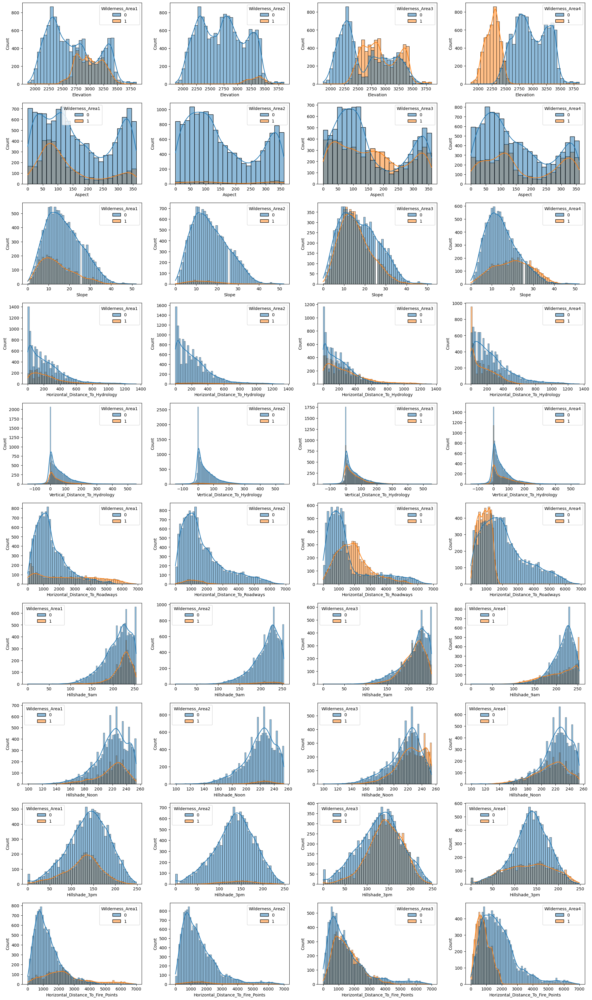

In [29]:
w = data[['Wilderness_Area1','Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4']]
plt.figure(figsize=(20,50))
plotnumber = 1
for column in con_data:
    for col in w:
        if plotnumber<=45:
            plt.subplot(15,4,plotnumber)
            sns.histplot(x=data[column],hue=data[col],kde=True)
            plotnumber+=1
plt.tight_layout()

### Insights
- In Wilderness Area 4 , the elevation distance ranges from 2000 to 2600 and it has minimum elevation distance.
- In Wilderness Area 2 , the elevation distance ranges from 3000 to 3600 and it has maximum elevation distance.
- In Wilderness Area 2 , the values are less when compared to other Wilderness Area
- In Wilderness Area 3 , the values are more when compared to other Wilderness Area

<Axes: xlabel='Elevation', ylabel='Count'>

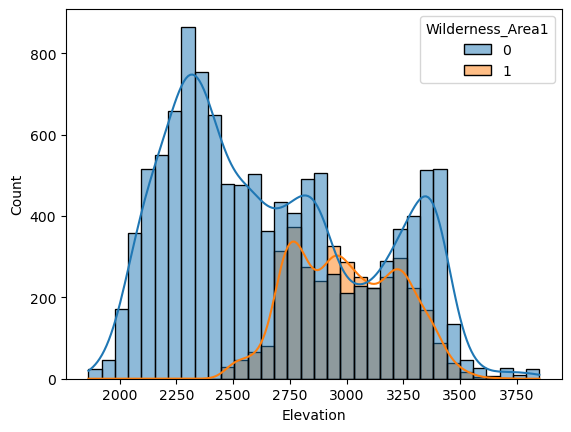

In [30]:
sns.histplot(x=data['Elevation'],hue=data['Wilderness_Area1'],kde=True)

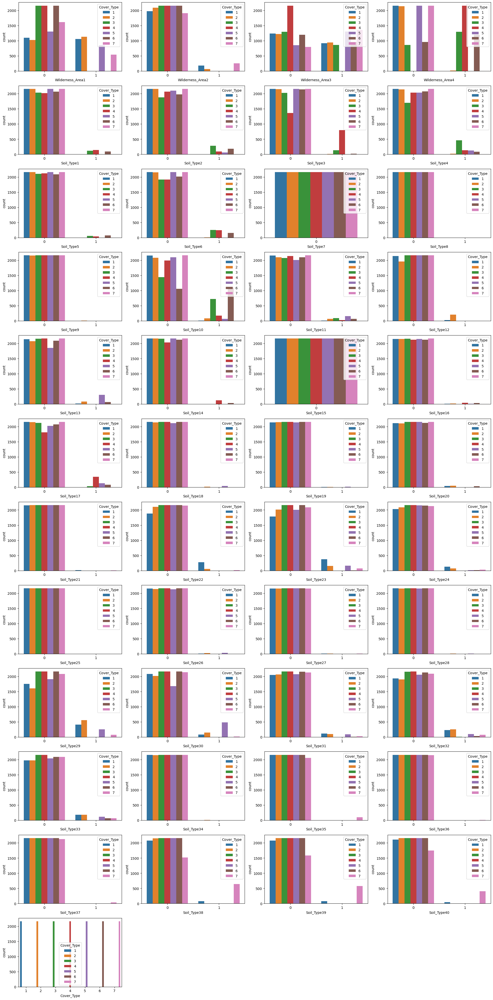

In [31]:
plt.figure(figsize=(20,50))
plotnumber = 1
for column in dis_data:
    if plotnumber<=45:
        plt.subplot(15,4,plotnumber)
        sns.countplot(x=data[column],hue=data['Cover_Type'])
        plotnumber+=1
plt.tight_layout()

### Insights
- The covertype (1,2,5,7) is present in Wilderness Area 1 - 1 and 2 are highest values
- The covertype (1,2,7) is present in Wilderness Area 2  - 7  are highest values
- The covertype (1,2,3,5,6,7) is present in Wilderness Area 3 - 5 and 7 are highest values
- The covertype (2,3,4,6) is present in Wilderness Area 4 - 4 has highest values
- The covertype (4) is only present in Wilderness Area 4
- Soil Type 10 has the highest values

# Multivariate 

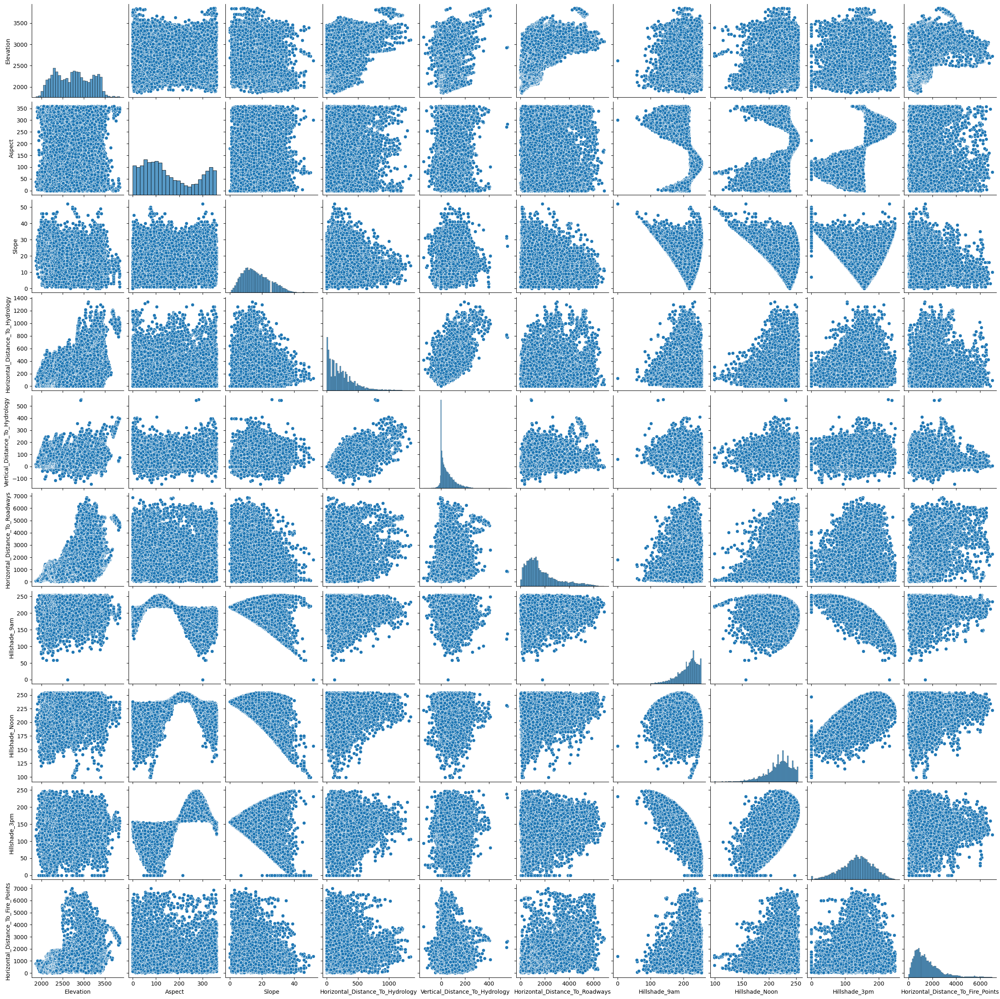

In [32]:
sns.pairplot(data=con_data)

# Task 2:-Create a predictive model which helps  to predict seven different cover types in four different wilderness areas of the Forest with the best accuracy.`

# Data Preprocessing

## Missing Values

In [33]:
data = original.copy()

In [34]:
data.isnull().sum()

Id                                    0
Elevation                             0
Aspect                                0
Slope                                 0
Horizontal_Distance_To_Hydrology      0
Vertical_Distance_To_Hydrology        0
Horizontal_Distance_To_Roadways       0
Hillshade_9am                         0
Hillshade_Noon                        0
Hillshade_3pm                         0
Horizontal_Distance_To_Fire_Points    0
Wilderness_Area1                      0
Wilderness_Area2                      0
Wilderness_Area3                      0
Wilderness_Area4                      0
Soil_Type1                            0
Soil_Type2                            0
Soil_Type3                            0
Soil_Type4                            0
Soil_Type5                            0
Soil_Type6                            0
Soil_Type7                            0
Soil_Type8                            0
Soil_Type9                            0
Soil_Type10                           0


### Insights
- There are no missing values

## Duplicates

In [35]:
data.duplicated().sum()

0

### Insights
- There are no duplicated values

## Outliers

<Axes: xlabel='Elevation'>

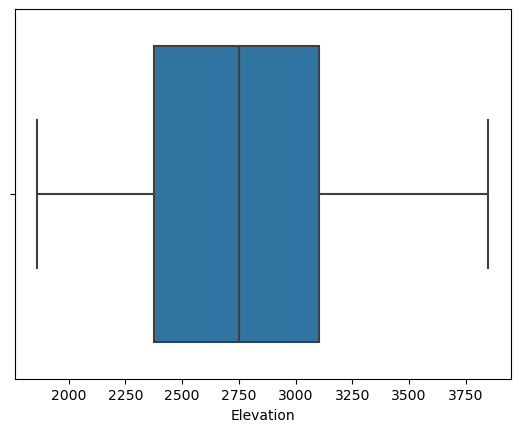

In [36]:
sns.boxplot(data=data, x='Elevation')

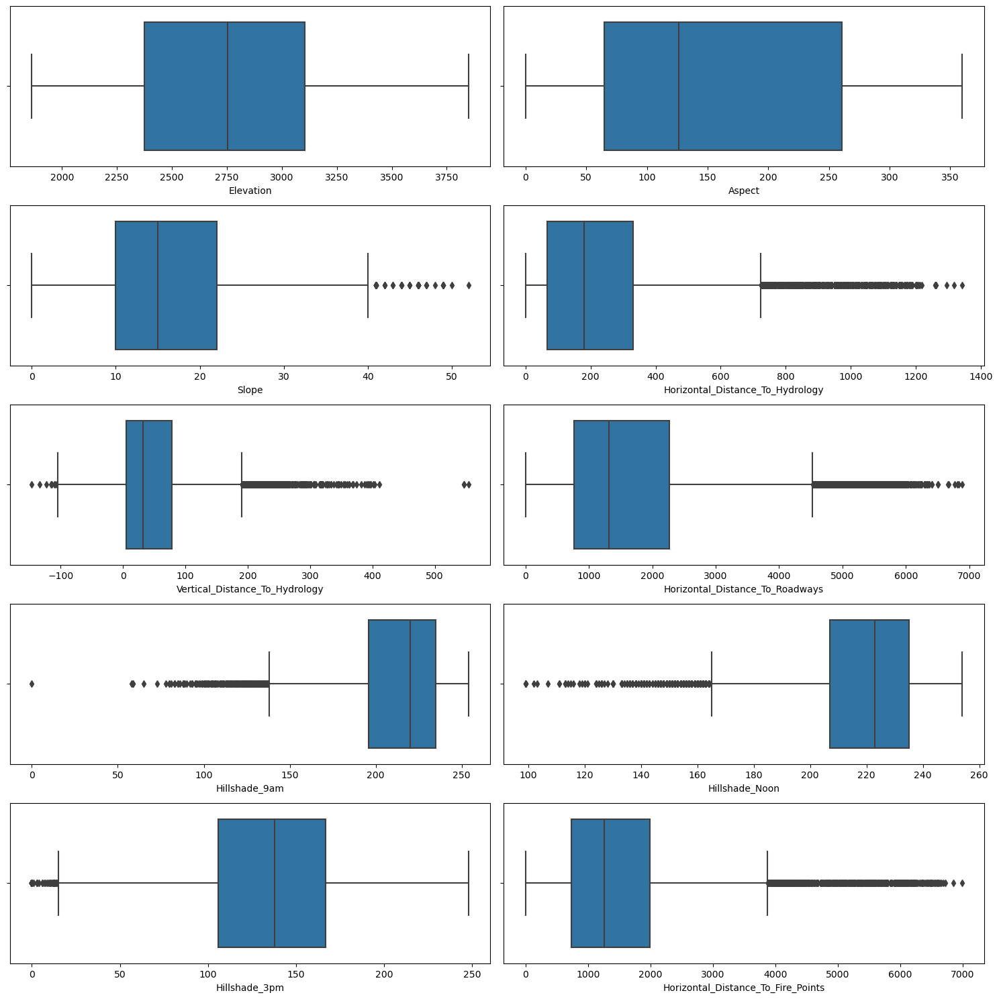

In [37]:
plt.figure(figsize=(15,15))
plotnumber = 1
for column in con_data:
    if plotnumber < 11:
        plt.subplot(5,2,plotnumber)
        sns.boxplot(x=data[column])
    plotnumber+=1
plt.tight_layout()

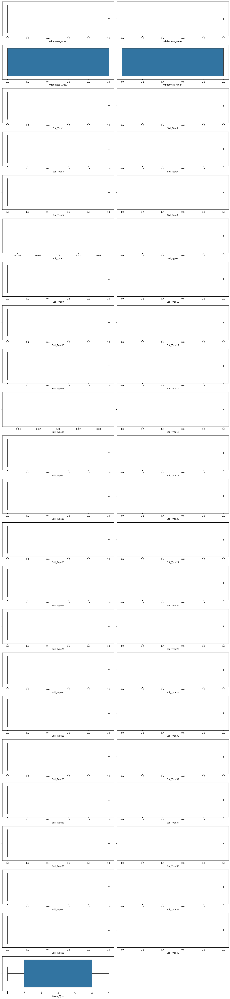

In [38]:
plt.figure(figsize=(15,70))
plotnumber = 1
for column in dis_data:
    if plotnumber < 50:
        plt.subplot(25,2,plotnumber)
        sns.boxplot(x=data[column])
    plotnumber+=1
plt.tight_layout()

### Insights
- Elevation and Aspect has no outliers.
- Outliers in other numerical variables which are continuous data will be handled.
- The outliers in discrete data are not handled,because that will lead to missing data or wrong information.

In [39]:
# The data is not normal distribution , so we are using IQR.
Q1 = data.quantile(0.25)
Q3 = data.quantile(0.75)
IQR = Q3 - Q1 
IQR

Id                                    7559.50
Elevation                              728.00
Aspect                                 196.00
Slope                                   12.00
Horizontal_Distance_To_Hydrology       263.00
Vertical_Distance_To_Hydrology          74.00
Horizontal_Distance_To_Roadways       1506.00
Hillshade_9am                           39.00
Hillshade_Noon                          28.00
Hillshade_3pm                           61.00
Horizontal_Distance_To_Fire_Points    1258.25
Wilderness_Area1                         0.00
Wilderness_Area2                         0.00
Wilderness_Area3                         1.00
Wilderness_Area4                         1.00
Soil_Type1                               0.00
Soil_Type2                               0.00
Soil_Type3                               0.00
Soil_Type4                               0.00
Soil_Type5                               0.00
Soil_Type6                               0.00
Soil_Type7                        

In [40]:
lowerlimit = Q1 - 1.5 * IQR
lowerlimit

Id                                   -7558.500
Elevation                             1284.000
Aspect                                -229.000
Slope                                   -8.000
Horizontal_Distance_To_Hydrology      -327.500
Vertical_Distance_To_Hydrology        -106.000
Horizontal_Distance_To_Roadways      -1495.000
Hillshade_9am                          137.500
Hillshade_Noon                         165.000
Hillshade_3pm                           14.500
Horizontal_Distance_To_Fire_Points   -1157.375
Wilderness_Area1                         0.000
Wilderness_Area2                         0.000
Wilderness_Area3                        -1.500
Wilderness_Area4                        -1.500
Soil_Type1                               0.000
Soil_Type2                               0.000
Soil_Type3                               0.000
Soil_Type4                               0.000
Soil_Type5                               0.000
Soil_Type6                               0.000
Soil_Type7   

In [41]:
upperlimit = Q3 + 1.5 * IQR
upperlimit

Id                                    22679.500
Elevation                              4196.000
Aspect                                  555.000
Slope                                    40.000
Horizontal_Distance_To_Hydrology        724.500
Vertical_Distance_To_Hydrology          190.000
Horizontal_Distance_To_Roadways        4529.000
Hillshade_9am                           293.500
Hillshade_Noon                          277.000
Hillshade_3pm                           258.500
Horizontal_Distance_To_Fire_Points     3875.625
Wilderness_Area1                          0.000
Wilderness_Area2                          0.000
Wilderness_Area3                          2.500
Wilderness_Area4                          2.500
Soil_Type1                                0.000
Soil_Type2                                0.000
Soil_Type3                                0.000
Soil_Type4                                0.000
Soil_Type5                                0.000
Soil_Type6                              

In [42]:
out = (con_data<lowerlimit).sum() / len(data) * 100 + (con_data>upperlimit).sum() / len(data) * 100
per = out[out !=0]
per

Hillshade_3pm                         0.820106
Hillshade_9am                         2.698413
Hillshade_Noon                        2.599206
Horizontal_Distance_To_Fire_Points    4.265873
Horizontal_Distance_To_Hydrology      3.386243
Horizontal_Distance_To_Roadways       5.489418
Slope                                 0.376984
Vertical_Distance_To_Hydrology        3.875661
dtype: float64

In [43]:
per.index

Index(['Hillshade_3pm', 'Hillshade_9am', 'Hillshade_Noon',
       'Horizontal_Distance_To_Fire_Points',
       'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Slope', 'Vertical_Distance_To_Hydrology'],
      dtype='object')

In [44]:
c = data[['Hillshade_3pm', 'Hillshade_9am','Hillshade_Noon', 'Horizontal_Distance_To_Fire_Points',
       'Horizontal_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways','Slope',
         'Vertical_Distance_To_Hydrology']]
c

,Hillshade_3pm,Hillshade_9am,Hillshade_Noon,Horizontal_Distance_To_Fire_Points,Horizontal_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Slope,Vertical_Distance_To_Hydrology
0,148,221,232,6279,258,510,3,0
1,151,220,235,6225,212,390,2,-6
2,135,234,238,6121,268,3180,9,65
3,122,238,238,6211,242,3090,18,118
4,150,220,234,6172,153,391,2,-1
...,...,...,...,...,...,...,...,...
15115,214,170,251,1282,258,660,23,7
15116,91,249,221,1325,633,618,19,195
15117,83,250,220,1187,365,335,25,117
15118,119,229,237,932,218,242,28,101


In [45]:
for column in c:
    upper_limit_value = upperlimit[column]
    data.loc[data[column] > upper_limit_value, column] = data[column].median()

In [46]:
for column in c:
    lower_limit_value = lowerlimit[column]
    data.loc[data[column] < lower_limit_value, column] = data[column].median()

In [47]:
out = (data<lowerlimit).sum() / len(data) * 100 + (data>upperlimit).sum() / len(data) * 100
out

Id                                     0.000000
Elevation                              0.000000
Aspect                                 0.000000
Slope                                  0.000000
Horizontal_Distance_To_Hydrology       0.000000
Vertical_Distance_To_Hydrology         0.000000
Horizontal_Distance_To_Roadways        0.000000
Hillshade_9am                          0.000000
Hillshade_Noon                         0.000000
Hillshade_3pm                          0.000000
Horizontal_Distance_To_Fire_Points     0.000000
Wilderness_Area1                      23.789683
Wilderness_Area2                       3.300265
Wilderness_Area3                       0.000000
Wilderness_Area4                       0.000000
Soil_Type1                             2.347884
Soil_Type2                             4.120370
Soil_Type3                             6.362434
Soil_Type4                             5.575397
Soil_Type5                             1.091270
Soil_Type6                             4

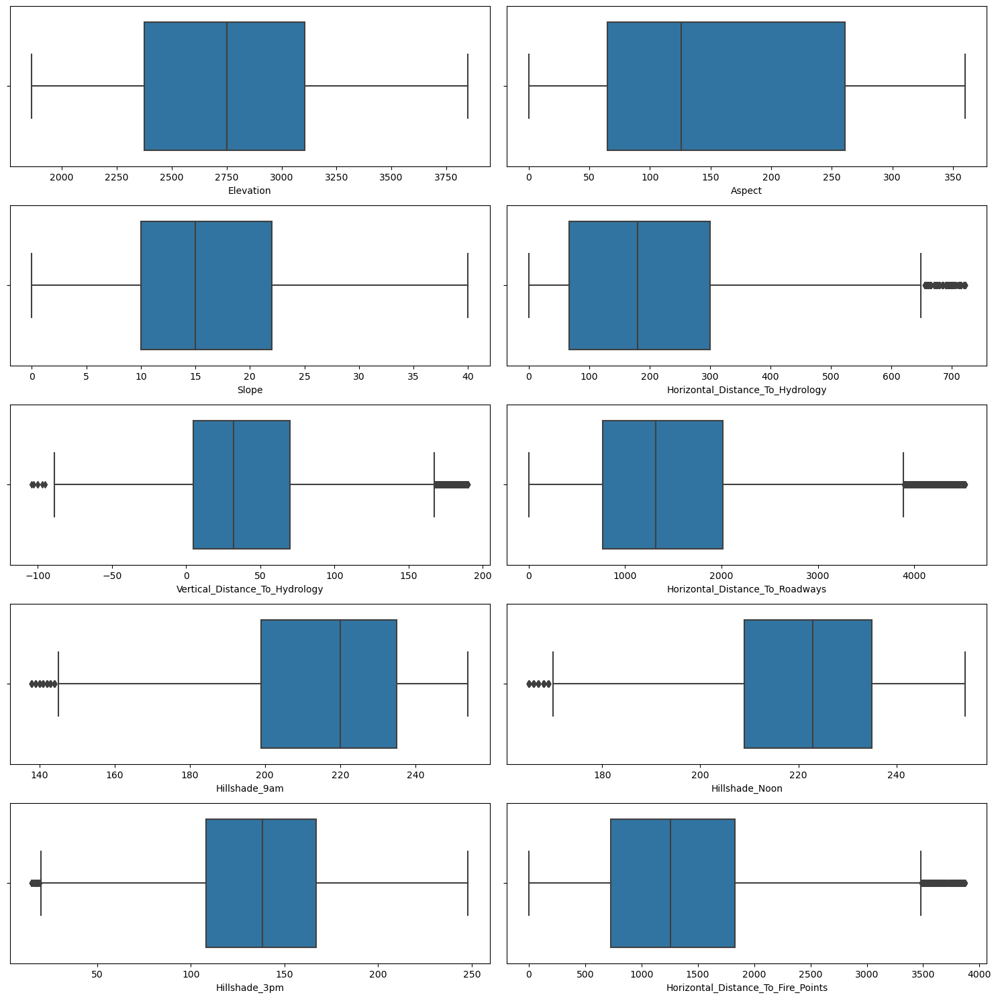

In [48]:
# Visualization after handling outliers
plt.figure(figsize=(15,15))
plotnumber = 1
for column in con_data:
    if plotnumber < 11:
        plt.subplot(5,2,plotnumber)
        sns.boxplot(x=data[column])
    plotnumber+=1
plt.tight_layout()

### Insights
- Outliers in ['Slope','Horizontal_Distance_To_Hydrology','Vertical_Distance_To_Hydrology','Hillshade_9am','Hillshade_Noon','Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points'] columns are handled outliers using median.

In [49]:
data.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,2596,51,3,258,0,510,221,232,148,1256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,2590,56,2,212,-6,390,220,235,151,1256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,2804,139,9,268,65,3180,234,238,135,1256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,2785,155,18,242,118,3090,238,238,122,1256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,2595,45,2,153,-1,391,220,234,150,1256,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


## Scaling

In [50]:
df = data.copy()

In [51]:
from sklearn.preprocessing import StandardScaler
scale = StandardScaler()

In [52]:
con_data.columns

Index(['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points'],
      dtype='object')

In [53]:
s = df[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points']]

In [54]:
df[['Elevation', 'Aspect', 'Slope', 'Horizontal_Distance_To_Hydrology',
       'Vertical_Distance_To_Hydrology', 'Horizontal_Distance_To_Roadways',
       'Hillshade_9am', 'Hillshade_Noon', 'Hillshade_3pm',
       'Horizontal_Distance_To_Fire_Points']] = scale.fit_transform(s)

In [55]:
df.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,-0.367095,-0.959980,-1.618016,0.335982,-0.905793,-0.975798,0.213336,0.563456,0.266433,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,-0.381461,-0.914559,-1.738847,0.057286,-1.031228,-1.094164,0.175359,0.714832,0.334167,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,0.130912,-0.160577,-0.893030,0.396568,0.453095,1.657844,0.707028,0.866207,-0.027078,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,0.085421,-0.015231,0.194448,0.239044,1.561112,1.569070,0.858934,0.866207,-0.320590,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,-0.369489,-1.014485,-1.738847,-0.300172,-0.926699,-1.093177,0.175359,0.664373,0.311589,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


# Feature Engineering

## Checking Correlation

In [56]:
df.corr()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type7,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type15,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
Id,1.000000,0.185496,0.017702,-0.013694,0.052320,0.020122,0.088534,-0.019249,0.049363,0.034953,0.042457,-0.339861,0.158484,0.384219,-0.158451,-0.058451,0.045545,-0.045757,0.118214,-0.041713,-0.046017,NaN,-0.013159,-0.014219,0.032292,0.063372,-0.129930,0.015145,-0.016034,NaN,-0.003794,-0.002940,-0.070252,-0.029707,-0.069537,0.014734,0.035739,-0.017422,0.034019,0.005675,0.031176,0.024141,-0.005104,-0.231780,-0.157515,0.025826,0.068048,0.066887,0.022520,0.057480,0.009110,0.016040,0.086932,0.083376,0.122475,0.108363
Elevation,0.185496,1.000000,-0.011096,-0.313916,0.319332,0.029144,0.558341,0.035442,0.184432,0.081809,0.505615,0.330417,0.261729,0.354025,-0.783651,-0.218818,-0.147947,-0.307523,-0.125342,-0.141478,-0.187354,NaN,0.002934,-0.010571,-0.357816,-0.037906,0.017432,0.039304,-0.140619,NaN,-0.066252,-0.200663,-0.035173,0.029808,0.008548,0.032509,0.146236,0.159872,0.097647,0.010586,0.020669,0.040019,-0.001077,0.165304,0.048204,0.093191,0.172349,0.123821,0.021876,0.120157,0.040571,0.073825,0.323440,0.296405,0.306755,0.016090
Aspect,0.017702,-0.011096,1.000000,0.030302,0.022637,0.053653,0.030294,-0.555086,0.300938,0.643217,-0.048840,-0.131262,0.028238,0.032578,0.075228,-0.024538,-0.020970,-0.069120,0.018019,0.000343,-0.006066,NaN,0.001723,-0.019391,0.111959,-0.034549,-0.044142,0.024312,0.001181,NaN,0.027121,0.029870,-0.042140,0.007570,-0.023330,0.018815,0.022301,0.041880,0.005480,-0.002340,-0.009775,0.018986,0.026330,-0.063428,-0.086897,0.008160,0.003700,0.018719,0.012927,-0.004235,0.003160,-0.046309,0.043860,-0.031342,0.007208,0.008015
Slope,-0.013694,-0.313916,0.030302,1.000000,-0.014054,0.296081,-0.216553,-0.040284,-0.498457,-0.287081,-0.195800,-0.158170,-0.064864,-0.109892,0.288151,0.097548,-0.080470,0.264844,0.092981,0.077730,-0.046057,NaN,-0.013159,-0.022352,0.257775,-0.109930,-0.115904,0.121967,-0.053821,NaN,-0.064534,-0.124293,-0.069969,-0.048026,-0.068688,-0.034227,-0.075986,-0.185413,0.020129,0.011408,-0.030557,0.012981,0.037183,-0.080799,0.105241,-0.076494,-0.148524,0.074070,-0.030735,-0.048800,-0.004323,0.003832,-0.148514,0.047480,-0.042077,0.087287
Horizontal_Distance_To_Hydrology,0.052320,0.319332,0.022637,-0.014054,1.000000,0.520492,0.104491,-0.038818,0.036764,0.045545,0.152234,0.032025,0.090412,0.131280,-0.204648,-0.084725,0.061804,-0.075077,-0.039306,-0.016445,0.058639,NaN,0.004802,-0.003187,-0.085972,0.050766,0.055629,0.013837,-0.126511,NaN,-0.094914,-0.192776,-0.013841,-0.034953,-0.073267,-0.027221,0.006534,-0.090990,0.033309,-0.004659,0.036363,0.003791,0.009251,0.067521,-0.007897,0.041803,0.159313,0.063093,0.023884,-0.029540,0.006851,-0.014749,0.029821,0.079984,0.133529,-0.078113
Vertical_Distance_To_Hydrology,0.020122,0.029144,0.053653,0.296081,0.520492,1.000000,-0.027130,-0.037900,-0.128234,-0.047703,-0.004752,-0.099844,0.004643,0.021051,0.067713,-0.032983,0.018924,0.109491,-0.011200,0.025673,0.112351,NaN,-0.007707,-0.014536,0.050589,-0.021074,-0.024971,0.074269,-0.094724,NaN,-0.075753,-0.165895,-0.040656,-0.043409,-0.068518,-0.023145,-0.058899,-0.147564,0.018601,-0.013657,-0.011187,0.002244,-0.009294,-0.033205,0.014644,-0.004308,0.017553,0.071086,0.013886,-0.036559,0.024241,-0.018831,-0.018892,0.049720,0.084788,0.043895
Horizontal_Distance_To_Roadways,0.088534,0.558341,0

<Axes: >

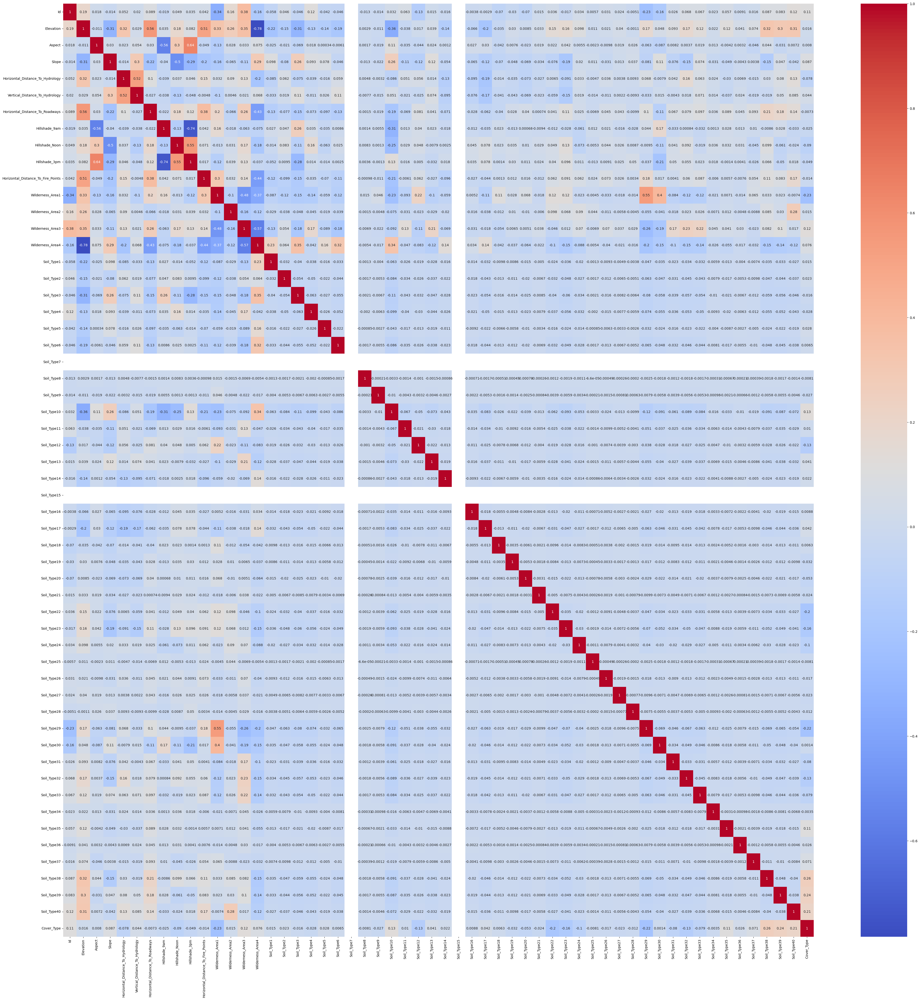

In [57]:
plt.figure(figsize=(50,50))
sns.heatmap(data=df.corr(),annot=True,cmap='coolwarm')

### Insights 
- Dropping Soil Type 7 and Soil Type 15 columns because it has only one unique value. 

In [58]:
df.drop(['Soil_Type7','Soil_Type15'],axis=1,inplace=True)

<Axes: >

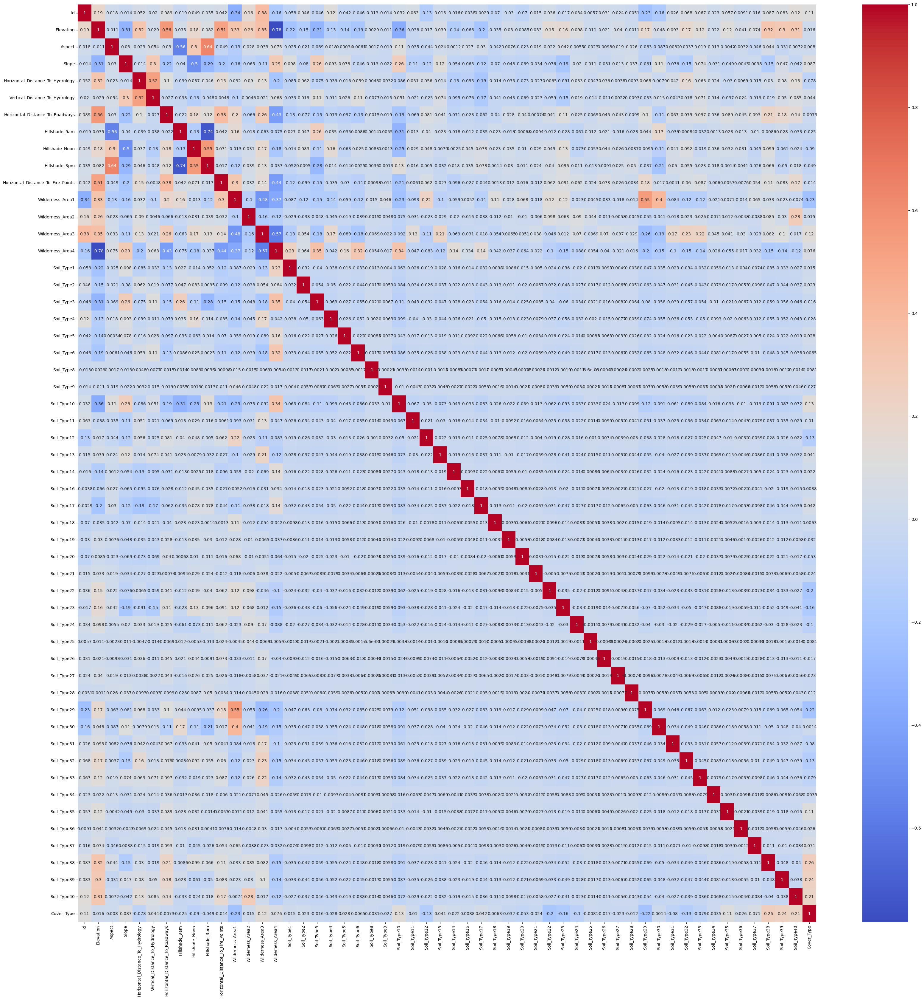

In [59]:
plt.figure(figsize=(40,40))
sns.heatmap(data=df.corr(),annot=True,cmap='coolwarm')

In [60]:
df.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40,Cover_Type
0,1,-0.367095,-0.959980,-1.618016,0.335982,-0.905793,-0.975798,0.213336,0.563456,0.266433,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
1,2,-0.381461,-0.914559,-1.738847,0.057286,-1.031228,-1.094164,0.175359,0.714832,0.334167,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5
2,3,0.130912,-0.160577,-0.893030,0.396568,0.453095,1.657844,0.707028,0.866207,-0.027078,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,2
3,4,0.085421,-0.015231,0.194448,0.239044,1.561112,1.569070,0.858934,0.866207,-0.320590,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,2
4,5,-0.369489,-1.014485,-1.738847,-0.300172,-0.926699,-1.093177,0.175359,0.664373,0.311589,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,5


# Model Creation

## Define x and y 

In [61]:
data.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

In [62]:
x = df.drop('Cover_Type',axis=1)
x.head()

,Id,Elevation,Aspect,Slope,Horizontal_Distance_To_Hydrology,Vertical_Distance_To_Hydrology,Horizontal_Distance_To_Roadways,Hillshade_9am,Hillshade_Noon,Hillshade_3pm,Horizontal_Distance_To_Fire_Points,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Soil_Type1,Soil_Type2,Soil_Type3,Soil_Type4,Soil_Type5,Soil_Type6,Soil_Type8,Soil_Type9,Soil_Type10,Soil_Type11,Soil_Type12,Soil_Type13,Soil_Type14,Soil_Type16,Soil_Type17,Soil_Type18,Soil_Type19,Soil_Type20,Soil_Type21,Soil_Type22,Soil_Type23,Soil_Type24,Soil_Type25,Soil_Type26,Soil_Type27,Soil_Type28,Soil_Type29,Soil_Type30,Soil_Type31,Soil_Type32,Soil_Type33,Soil_Type34,Soil_Type35,Soil_Type36,Soil_Type37,Soil_Type38,Soil_Type39,Soil_Type40
0,1,-0.367095,-0.959980,-1.618016,0.335982,-0.905793,-0.975798,0.213336,0.563456,0.266433,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
1,2,-0.381461,-0.914559,-1.738847,0.057286,-1.031228,-1.094164,0.175359,0.714832,0.334167,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
2,3,0.130912,-0.160577,-0.893030,0.396568,0.453095,1.657844,0.707028,0.866207,-0.027078,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,4,0.085421,-0.015231,0.194448,0.239044,1.561112,1.569070,0.858934,0.866207,-0.320590,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
4,5,-0.369489,-1.014485,-1.738847,-0.300172,-0.926699,-1.093177,0.175359,0.664373,0.311589,-0.120671,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0


In [63]:
y = df['Cover_Type']
y

0        5
1        5
2        2
3        2
4        5
        ..
15115    3
15116    3
15117    3
15118    3
15119    3
Name: Cover_Type, Length: 15120, dtype: int64

## Splitting data into Training and Testing

In [64]:
from sklearn.model_selection import train_test_split
x_train, x_test , y_train,y_test = train_test_split(x,y,test_size=0.25,random_state=42)

In [65]:
x_train.shape

(11340, 53)

In [66]:
x_test.shape

(3780, 53)

## Model Training

In [67]:
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier

### Support Vector Machine

In [68]:
svc_model = SVC()
svc_model.fit(x_train,y_train)

SVC()

In [69]:
svc_pred = svc_model.predict(x_test)
svc_pred

array([6, 7, 6, ..., 7, 6, 7], dtype=int64)

### Decision Tree

In [70]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train,y_train)

DecisionTreeClassifier()

In [71]:
dt_pred = dt_model.predict(x_test)
dt_pred

array([6, 6, 1, ..., 2, 1, 5], dtype=int64)

### K-Nearest Neighbour

In [72]:
knn_model = KNeighborsClassifier()
knn_model.fit(x_train,y_train)

KNeighborsClassifier()

In [73]:
knn_pred = knn_model.predict(x_test)
knn_pred

array([6, 2, 1, ..., 2, 1, 6], dtype=int64)

### Random Forest 

In [74]:
rf_model  = RandomForestClassifier()
rf_model.fit(x_train,y_train)

RandomForestClassifier()

In [75]:
rf_pred = rf_model.predict(x_test)
rf_pred

array([6, 6, 1, ..., 2, 1, 6], dtype=int64)

# Model Evaluation

In [76]:
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score , classification_report

### Support Vector Classifier

In [77]:
svc_cm = confusion_matrix(y_test,svc_pred)
svc_cm

array([[  0,  83,   0,  14,  39,  32, 352],
       [  0, 189,   0,  29,  41,  28, 273],
       [  0,   0,   0, 192,  27,  36, 281],
       [  0,   0,   0, 391,  10,  22, 129],
       [  0,  64,   0,  84,  72,  63, 244],
       [  0,   0,   0, 145,  40,  73, 273],
       [  0,   0,   0,  29,  31,  17, 477]], dtype=int64)

In [78]:
svc_acc = accuracy_score(y_test, svc_pred)
svc_acc

0.317989417989418

In [79]:
svc_cr = classification_report(y_test, svc_pred)
print(svc_cr)

              precision    recall  f1-score   support

           1       0.00      0.00      0.00       520
           2       0.56      0.34      0.42       560
           3       0.00      0.00      0.00       536
           4       0.44      0.71      0.54       552
           5       0.28      0.14      0.18       527
           6       0.27      0.14      0.18       531
           7       0.24      0.86      0.37       554

    accuracy                           0.32      3780
   macro avg       0.26      0.31      0.24      3780
weighted avg       0.26      0.32      0.25      3780



### Decision Tree

In [80]:
confusion_matrix(y_test,dt_pred)

array([[354, 112,   0,   0,  15,   1,  38],
       [140, 340,  17,   0,  44,  14,   5],
       [  3,   8, 404,  27,   7,  87,   0],
       [  0,   0,  17, 524,   1,  10,   0],
       [  9,  47,  12,   0, 455,   4,   0],
       [  2,   9,  54,  20,  12, 434,   0],
       [ 46,   3,   0,   0,   1,   0, 504]], dtype=int64)

In [81]:
dt_acc = accuracy_score(y_test,dt_pred)
dt_acc

0.7976190476190477

In [82]:
dt_cr = classification_report(y_test, dt_pred)
print(dt_cr)

              precision    recall  f1-score   support

           1       0.64      0.68      0.66       520
           2       0.66      0.61      0.63       560
           3       0.80      0.75      0.78       536
           4       0.92      0.95      0.93       552
           5       0.85      0.86      0.86       527
           6       0.79      0.82      0.80       531
           7       0.92      0.91      0.92       554

    accuracy                           0.80      3780
   macro avg       0.80      0.80      0.80      3780
weighted avg       0.80      0.80      0.80      3780



### KNN

In [83]:
knn_cm = confusion_matrix(y_test,knn_pred)
knn_cm

array([[185, 106,  23,   9,  71,  23, 103],
       [139, 219,  27,   2,  79,  33,  61],
       [ 18,  34, 251, 103,  41,  82,   7],
       [  2,   3,  75, 418,  10,  44,   0],
       [ 75,  47,  38,  14, 294,  31,  28],
       [ 17,  22, 113,  58,  51, 261,   9],
       [121,  30,  23,   7,  48,  25, 300]], dtype=int64)

In [84]:
knn_acc = accuracy_score(y_test,knn_pred)
knn_acc

0.5100529100529101

In [85]:
knn_cr = classification_report(y_test, knn_pred)
print(knn_cr)

              precision    recall  f1-score   support

           1       0.33      0.36      0.34       520
           2       0.48      0.39      0.43       560
           3       0.46      0.47      0.46       536
           4       0.68      0.76      0.72       552
           5       0.49      0.56      0.52       527
           6       0.52      0.49      0.51       531
           7       0.59      0.54      0.56       554

    accuracy                           0.51      3780
   macro avg       0.51      0.51      0.51      3780
weighted avg       0.51      0.51      0.51      3780



### Random Forest

In [86]:
rf_cm = confusion_matrix(y_test,rf_pred)
rf_cm

array([[403,  72,   0,   0,  18,   0,  27],
       [ 95, 391,  19,   0,  40,  11,   4],
       [  0,   1, 455,  22,   1,  57,   0],
       [  0,   0,   6, 540,   0,   6,   0],
       [  2,  12,  12,   0, 497,   4,   0],
       [  0,   2,  31,  13,   1, 484,   0],
       [ 17,   1,   0,   0,   0,   0, 536]], dtype=int64)

In [87]:
rf_acc = accuracy_score(y_test,rf_pred)
rf_acc

0.8746031746031746

In [88]:
rf_cr = classification_report(y_test, rf_pred)
print(rf_cr)

              precision    recall  f1-score   support

           1       0.78      0.78      0.78       520
           2       0.82      0.70      0.75       560
           3       0.87      0.85      0.86       536
           4       0.94      0.98      0.96       552
           5       0.89      0.94      0.92       527
           6       0.86      0.91      0.89       531
           7       0.95      0.97      0.96       554

    accuracy                           0.87      3780
   macro avg       0.87      0.87      0.87      3780
weighted avg       0.87      0.87      0.87      3780



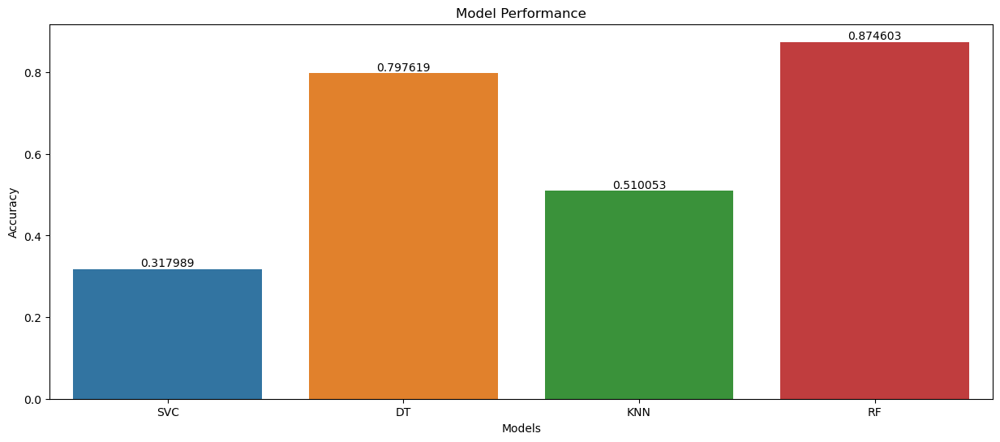

In [89]:
models = ['SVC','DT','KNN','RF']
r = [svc_acc,dt_acc,knn_acc,rf_acc]
plt.figure(figsize=(15,6))
plt.title('Model Performance')
plt.xlabel('Models')
plt.ylabel('Accuracy')
ax = sns.barplot(x=models,y=r)
for label in ax.containers:
  ax.bar_label(label)

### Insights 
- Random forest model accuracy is 87.4 % and it gives the best accuracy without hyperparameter.
- Decision Tree model accuracy is 79 % and it gives the second best accuracy without hyperparameter.

# Hyperparameter Tuning

### Insights
- The hyperparameter tuning is used for Random Forest model and Decision Tree model because the performance of both models is good

## Random Forest

In [90]:
from sklearn.model_selection import RandomizedSearchCV
param_grid = {'n_estimators': [0, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4, 12.8, 25.6, 51.2, 102.4, 200],
              'max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],
              'max_features': ['auto', 'sqrt', 'log2', None],
              'bootstrap':[True, False]
}

In [91]:
RF = RandomForestClassifier(random_state=42)
scv = RandomizedSearchCV(estimator=RF, param_distributions=param_grid, n_iter=100, cv=3,
                          scoring='accuracy', verbose=2, random_state=42, n_jobs=-1)

In [92]:
scv.fit(x_train, y_train)
cv_best_params = scv.best_params_
print(f"Best parameters: {cv_best_params}")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 1, 'max_features': 'auto', 'max_depth': 14, 'bootstrap': False}


In [93]:
RF2=RandomForestClassifier(max_depth= 40, max_features= 'auto', min_samples_leaf=1, min_samples_split= 2, n_estimators=733)
RF2.fit(x_train, y_train)
y_predict_RF=RF2.predict(x_test)

In [94]:
rf = accuracy_score(y_test,y_predict_RF)
rf

0.8788359788359789

In [95]:
param_grid = {'ccp_alpha': [0, 0.1, 0.2, 0.4, 0.8, 1.6, 3.2, 6.4, 12.8, 25.6, 51.2, 102.4, 200],
              'max_depth': [5, 6, 7, 8, 9, 10, 11, 12, 13, 14],
              'min_samples_split': [2, 5, 10],
              'min_samples_leaf': [1, 2, 4],
              'max_features': ['auto', 'sqrt', 'log2', None]}

DT = DecisionTreeClassifier(random_state=42)
dcv = RandomizedSearchCV(estimator=DT, param_distributions=param_grid, n_iter=100, cv=3,
                          scoring='accuracy', verbose=2, random_state=42, n_jobs=-1)

dcv.fit(x_train, y_train)  # Training data on RandomizedSearchCV
cv_best_params = dcv.best_params_  # It will give you the best parameters
print(f"Best parameters: {cv_best_params}")

Fitting 3 folds for each of 100 candidates, totalling 300 fits
Best parameters: {'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 14, 'ccp_alpha': 0}


In [96]:
DT2=DecisionTreeClassifier(min_samples_split= 2, min_samples_leaf=2, max_features= None, max_depth= 14, ccp_alpha=0)
DT2.fit(x_train, y_train)
y_predict_DT2=DT2.predict(x_test)

In [97]:
dt = accuracy_score(y_test,y_predict_DT2)
dt

0.7968253968253968

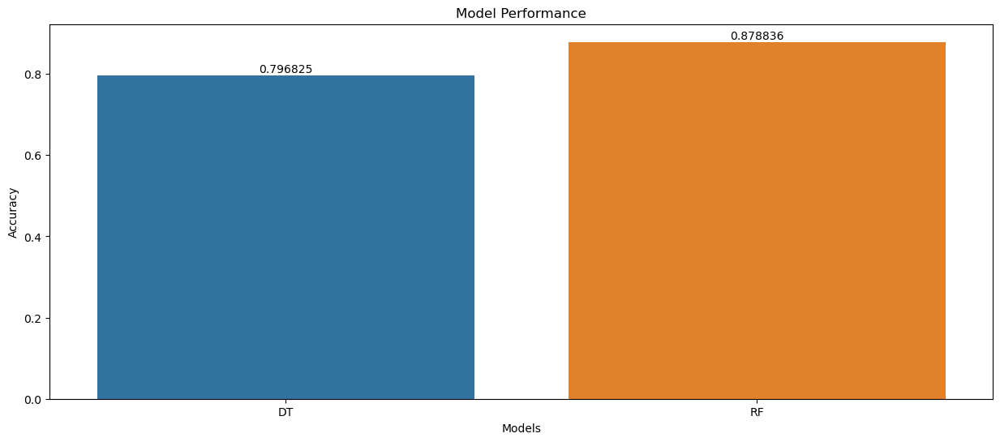

In [98]:
models1 = ['DT','RF']
r1 = [dt,rf]
plt.figure(figsize=(15,6))
plt.title('Model Performance')
plt.xlabel('Models')
plt.ylabel('Accuracy')
ax = sns.barplot(x=models1,y=r1)
for label in ax.containers:
  ax.bar_label(label)

### Insights 
- After hyperparameter tuning , the accuracy of Random Forest is 87.8 % 
- After hyperparameter tuning , the accuracy of Decision Tree is 79 % 

In [99]:
data.columns

Index(['Id', 'Elevation', 'Aspect', 'Slope',
       'Horizontal_Distance_To_Hydrology', 'Vertical_Distance_To_Hydrology',
       'Horizontal_Distance_To_Roadways', 'Hillshade_9am', 'Hillshade_Noon',
       'Hillshade_3pm', 'Horizontal_Distance_To_Fire_Points',
       'Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3',
       'Wilderness_Area4', 'Soil_Type1', 'Soil_Type2', 'Soil_Type3',
       'Soil_Type4', 'Soil_Type5', 'Soil_Type6', 'Soil_Type7', 'Soil_Type8',
       'Soil_Type9', 'Soil_Type10', 'Soil_Type11', 'Soil_Type12',
       'Soil_Type13', 'Soil_Type14', 'Soil_Type15', 'Soil_Type16',
       'Soil_Type17', 'Soil_Type18', 'Soil_Type19', 'Soil_Type20',
       'Soil_Type21', 'Soil_Type22', 'Soil_Type23', 'Soil_Type24',
       'Soil_Type25', 'Soil_Type26', 'Soil_Type27', 'Soil_Type28',
       'Soil_Type29', 'Soil_Type30', 'Soil_Type31', 'Soil_Type32',
       'Soil_Type33', 'Soil_Type34', 'Soil_Type35', 'Soil_Type36',
       'Soil_Type37', 'Soil_Type38', 'Soil_Type39', 'Soil_

## Prediction of Wilderness_Areas v/s Cover types area 

In [100]:
d = x_test[['Wilderness_Area1', 'Wilderness_Area2', 'Wilderness_Area3', 'Wilderness_Area4']]
new = pd.DataFrame(d)
new = pd.concat([d, pd.Series(y_predict_RF, name='Predicted_Cover_Type')], axis=1)

In [101]:
new.head(50)

,Wilderness_Area1,Wilderness_Area2,Wilderness_Area3,Wilderness_Area4,Predicted_Cover_Type
6077,0.0,0.0,0.0,1.0,NaN
7894,0.0,0.0,1.0,0.0,NaN
6820,1.0,0.0,0.0,0.0,NaN
1593,1.0,0.0,0.0,0.0,6.0
11986,0.0,0.0,0.0,1.0,NaN
6791,0.0,0.0,1.0,0.0,NaN
7501,1.0,0.0,0.0,0.0,NaN
2512,0.0,0.0,1.0,0.0,7.0
2254,0.0,0.0,0.0,1.0,2.0
4609,0.0,0.0,0.0,1.0,NaN


# Report :
* The data is already contained numerical and binary values(one-hot encoded) so need to look for the orginal dataset for learn about the dataset like what are the covertypes and wilderness.
* For hyperparameter tuning only randomzied searchcv applied because the number of columns is more. 
* Time consuming for hyperparameter tuning.I reduced the n_iter value and set it as 100.